<a href="https://colab.research.google.com/github/lincolndibler/BrainTumorClassification/blob/main/BrainTumorClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🧠 Automated Brain Tumor Classification using MRI
# Author: Lincoln | Date: 2025-06-21
# GitHub Repo: https://github.com/yourusername/yourproject
# Dataset: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset


# **Project Overview**

This notebook documents the development of a reproducible machine learning pipeline for classifying brain tumors using MRI data.


# **Preprocessing**

## Mount Google Drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load Libraries

In [22]:
# Install any missing packages (e.g., if using Colab)
!pip install -q kaggle opencv-python matplotlib seaborn

# Standard imports
import os
import zipfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tensorflow as tf
import random
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model


from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

from tensorflow.keras.applications import ResNet50

from tensorflow.keras.applications import EfficientNetB0

from sklearn.metrics import confusion_matrix

from tensorflow.keras.preprocessing import image

from tensorflow.keras.applications.efficientnet import preprocess_input

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras.preprocessing import image

## Connecting to Kaggle Dataset

In [4]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"lincolndibler1","key":"aa38685ba514f3dc5d7d211a30e18dd2"}'}

In [5]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [6]:
# Replace the dataset slug with the one from Kaggle
!kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset
!unzip brain-tumor-mri-dataset.zip -d data/

Streaming output truncated to the last 5000 lines.
  inflating: data/Training/glioma/Tr-gl_0712.jpg  
  inflating: data/Training/glioma/Tr-gl_0713.jpg  
  inflating: data/Training/glioma/Tr-gl_0714.jpg  
  inflating: data/Training/glioma/Tr-gl_0715.jpg  
  inflating: data/Training/glioma/Tr-gl_0716.jpg  
  inflating: data/Training/glioma/Tr-gl_0717.jpg  
  inflating: data/Training/glioma/Tr-gl_0718.jpg  
  inflating: data/Training/glioma/Tr-gl_0719.jpg  
  inflating: data/Training/glioma/Tr-gl_0720.jpg  
  inflating: data/Training/glioma/Tr-gl_0721.jpg  
  inflating: data/Training/glioma/Tr-gl_0722.jpg  
  inflating: data/Training/glioma/Tr-gl_0723.jpg  
  inflating: data/Training/glioma/Tr-gl_0724.jpg  
  inflating: data/Training/glioma/Tr-gl_0725.jpg  
  inflating: data/Training/glioma/Tr-gl_0726.jpg  
  inflating: data/Training/glioma/Tr-gl_0727.jpg  
  inflating: data/Training/glioma/Tr-gl_0728.jpg  
  inflating: data/Training/glioma/Tr-gl_0729.jpg  
  inflating: data/Training/glio

## Inspecting Data Load

In [ ]:
import glob
for tumor_type in os.listdir('data/Training'):
    num_images = len(glob.glob(f"data/Training/{tumor_type}/*.jpg"))
    print(f"{tumor_type}: {num_images} images")

glioma: 1321 images
meningioma: 1339 images
notumor: 1595 images
pituitary: 1457 images


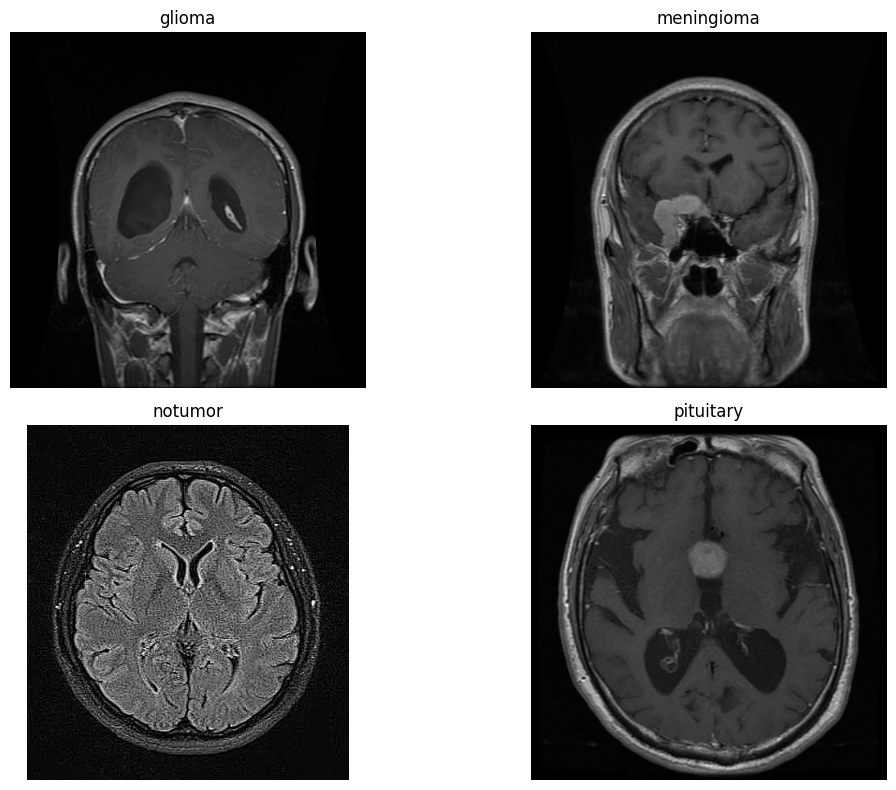

In [ ]:
# Set the path to your training data folder
train_path = 'data/Training'  # adjust if your folder structure differs

# Get the class folders (e.g., ['glioma', 'meningioma', ...])
classes = os.listdir(train_path)

# Plot one random image per class
plt.figure(figsize=(12, 8))

for i, tumor_type in enumerate(classes):
    tumor_dir = os.path.join(train_path, tumor_type)
    image_files = os.listdir(tumor_dir)
    random_image = random.choice(image_files)

    image_path = os.path.join(tumor_dir, random_image)
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 2, i+1)
    plt.imshow(img)
    plt.title(tumor_type)
    plt.axis('off')

plt.tight_layout()
plt.show()


## Loading and Applying Data Normalization (MobileNet + ResNet)


In [10]:
IMG_SIZE = 160
# Define generator with normalization and augmentation
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

# Training generator
train_gen = datagen.flow_from_directory(
    'data/Training',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=32,
    class_mode='sparse',
    subset='training'
)

# Validation generator
val_gen = datagen.flow_from_directory(
    'data/Training',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=32,
    class_mode='sparse',
    subset='validation'
)


Found 4571 images belonging to 4 classes.
Found 1141 images belonging to 4 classes.


## Create a Test Generator (for later model testing)

In [59]:
IMG_SIZE = 160
test_datagen = ImageDataGenerator(rescale=1./255)

test_gen = test_datagen.flow_from_directory(
    'data/Testing',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=32,
    class_mode='sparse',  # or 'categorical' if you're using one-hot encoding
    shuffle=False         # Important: don’t shuffle so predictions match file order
)


Found 1311 images belonging to 4 classes.


# **Model Training**


## MobileNetV2

In [ ]:
# Freeze base layers of MobileNetV2
mobilenet_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
mobilenet_base.trainable = False

# Custom classifier on top
x = mobilenet_base.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
output = Dense(4, activation='softmax')(x)

# Create full model with MobileNetV2 base
mobilenet_model = Model(inputs=mobilenet_base.input, outputs=output)

# Compile it
mobilenet_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
mobilenet_model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 80, 80,    │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 80, 80,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 80, 80,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 80, 80,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 80, 80,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 80, 80,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 81, 81,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 40, 40,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 40, 40,    │      2,304 │ block_1_depthwis

 Total params: 2,263,108 (8.63 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

In [ ]:
history_mobilenet = mobilenet_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=5,
    callbacks=[early_stop]
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 129s 853ms/step - accuracy: 0.3244 - loss: 1.5667 - val_accuracy: 0.6179 - val_loss: 1.0121
Epoch 2/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 142s 995ms/step - accuracy: 0.6483 - loss: 0.8771 - val_accuracy: 0.6819 - val_loss: 0.8776
Epoch 3/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 118s 829ms/step - accuracy: 0.7560 - loss: 0.6660 - val_accuracy: 0.7082 - val_loss: 0.8113
Epoch 4/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - accuracy: 0.7932 - loss: 0.5675 - val_accuracy: 0.7266 - val_loss: 0.7637
Epoch 5/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 144s 1s/step - accuracy: 0.8155 - loss: 0.5026 - val_accuracy: 0.7301 - val_loss: 0.7225
Restoring model weights from the end of the best epoch: 5.


In [ ]:
mobilenet_test_loss, mobilenet_test_acc = mobilenet_model.evaluate(test_gen)
print(f"🧪 Test accuracy: {mobilenet_test_acc:.4f}")


41/41 ━━━━━━━━━━━━━━━━━━━━ 27s 648ms/step - accuracy: 0.7578 - loss: 0.6335
🧪 Test accuracy: 0.8032


## ResNet50 Model

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Load ResNet50 base model
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
resnet_base.trainable = False  # Freeze base layers

# Add custom classifier head
x = resnet_base.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
output = Dense(4, activation='softmax')(x)

# Build and compile model
resnet_model = Model(inputs=resnet_base.input, outputs=output)
resnet_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

resnet_model.summary()

# Early stopping to prevent overfitting
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 166, 166,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 80, 80,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 80, 80,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 80, 80,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 82, 82,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 40, 40,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 40, 40,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 40, 40,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 40, 40,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 40, 40,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 40, 40,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 40, 40,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 40, 40,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 40, 40,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 40, 40,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 40, 40,    │      1,024 │ conv2_block1_3_c

 Total params: 23,595,908 (90.01 MB)

 Trainable params: 8,196 (32.02 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
history_resnet = resnet_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=5,
    callbacks=[early_stop]
)

Epoch 1/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 556s 4s/step - accuracy: 0.2496 - loss: 1.4933 - val_accuracy: 0.3663 - val_loss: 1.3515
Epoch 2/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 528s 4s/step - accuracy: 0.3099 - loss: 1.3903 - val_accuracy: 0.3663 - val_loss: 1.3273
Epoch 3/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 600s 4s/step - accuracy: 0.3717 - loss: 1.3417 - val_accuracy: 0.4365 - val_loss: 1.3061
Epoch 4/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 528s 4s/step - accuracy: 0.4159 - loss: 1.2987 - val_accuracy: 0.3996 - val_loss: 1.2890
Epoch 5/5
143/143 ━━━━━━━━━━━━━━━━━━━━ 566s 4s/step - accuracy: 0.4084 - loss: 1.2739 - val_accuracy: 0.4584 - val_loss: 1.2738
Restoring model weights from the end of the best epoch: 5.


In [ ]:
resnet_test_loss, resnet_test_acc = resnet_model.evaluate(test_gen)
print(f"🧪 Test accuracy: {resnet_test_acc:.4f}")

41/41 ━━━━━━━━━━━━━━━━━━━━ 128s 3s/step - accuracy: 0.2327 - loss: 1.3354
🧪 Test accuracy: 0.4706


## EfficientNetB0 Model

In [23]:
IMG_SIZE_effnet = 224
# Define generator with normalization and augmentation
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # instead of rescale
    validation_split=0.2
)
# Training generator
train_gen_effnet = datagen.flow_from_directory(
    'data/Training',
    target_size=(IMG_SIZE_effnet, IMG_SIZE_effnet),
    batch_size=32,
    class_mode='sparse',
    subset='training'
)

# Validation generator
val_gen_effnet = datagen.flow_from_directory(
    'data/Training',
    target_size=(IMG_SIZE_effnet, IMG_SIZE_effnet),
    batch_size=32,
    class_mode='sparse',
    subset='validation'
)


Found 4571 images belonging to 4 classes.
Found 1141 images belonging to 4 classes.


In [34]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_gen_effnet = test_datagen.flow_from_directory(
    'data/Testing',
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    shuffle=False
)


Found 1311 images belonging to 4 classes.


In [24]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Load base EfficientNetB0 (pretrained on ImageNet)
effnet_base = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(IMG_SIZE_effnet, IMG_SIZE_effnet, 3))
effnet_base.trainable = False  # Freeze base layers for now

# Add custom classifier head
x = effnet_base.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
output = Dense(4, activation='softmax')(x)  # 4 tumor classes

# Build full model
effnet_model = Model(inputs=effnet_base.input, outputs=output)

# Compile model
effnet_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

effnet_model.summary()

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_6         │ (None, 224, 224,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_3     │ (None, 224, 224,  │          7 │ rescaling_6[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_7         │ (None, 224, 224,  │          0 │ normalization_3[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_7[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,054,695 (15.47 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [25]:
history_effnet = effnet_model.fit(
    train_gen_effnet,
    validation_data=val_gen_effnet,
    epochs=8,
    callbacks=[early_stop]
)

Epoch 1/8
143/143 ━━━━━━━━━━━━━━━━━━━━ 535s 4s/step - accuracy: 0.3396 - loss: 1.3992 - val_accuracy: 0.5083 - val_loss: 1.1272
Epoch 2/8
143/143 ━━━━━━━━━━━━━━━━━━━━ 454s 3s/step - accuracy: 0.6129 - loss: 0.9818 - val_accuracy: 0.5741 - val_loss: 1.0151
Epoch 3/8
143/143 ━━━━━━━━━━━━━━━━━━━━ 452s 3s/step - accuracy: 0.7174 - loss: 0.7821 - val_accuracy: 0.6345 - val_loss: 0.9411
Epoch 4/8
143/143 ━━━━━━━━━━━━━━━━━━━━ 505s 4s/step - accuracy: 0.7637 - loss: 0.6769 - val_accuracy: 0.6696 - val_loss: 0.8802
Epoch 5/8
143/143 ━━━━━━━━━━━━━━━━━━━━ 445s 3s/step - accuracy: 0.7805 - loss: 0.6170 - val_accuracy: 0.6897 - val_loss: 0.8364
Epoch 6/8
143/143 ━━━━━━━━━━━━━━━━━━━━ 537s 3s/step - accuracy: 0.8072 - loss: 0.5664 - val_accuracy: 0.7099 - val_loss: 0.8039
Epoch 7/8
143/143 ━━━━━━━━━━━━━━━━━━━━ 500s 4s/step - accuracy: 0.8335 - loss: 0.5120 - val_accuracy: 0.7178 - val_loss: 0.7771
Epoch 8/8
143/143 ━━━━━━━━━━━━━━━━━━━━ 458s 3s/step - accuracy: 0.8390 - loss: 0.4967 - val_accuracy: 0.

In [29]:
test_loss_effnet, test_acc_effnet = effnet_model.evaluate(train_gen_effnet)
print(f"EfficientNetB0 Test Accuracy: {test_acc_effnet:.4f}")

KeyboardInterrupt: 

In [30]:
print(f"EfficientNetB0 Test Accuracy: {test_acc_effnet:.4f}")

EfficientNetB0 Test Accuracy: 0.8744


# **Saving and Loading Models**

## SAVE

In [ ]:
#EFFNET SAVE
effnet_model.save('/content/drive/MyDrive/effnet_model.keras')
effnet_model.save('effnet_model.h5')  # Save to HDF5 format

In [ ]:
#RESNET SAVE
resnet_model.save('/content/drive/MyDrive/resnet_model.keras')
resnet_model.save('resnet_model.keras')

In [65]:
#MOBILENET SAVE
mobilenet_model.save('/content/drive/MyDrive/mobilenet_model.keras')
mobilenet_model.save('mobilenet_model.keras')

## LOAD

In [ ]:
#EFFNET LOAD
effnet_model = load_model('/content/drive/MyDrive/effnet_model.keras')

In [ ]:
#RESNET LOAD
resnet_model = load_model('/content/drive/MyDrive/resnet_model.keras')

In [66]:
#MOBILENET LOAD
mobilenet_model = load_model('/content/drive/MyDrive/mobilenet_model.keras')

# **Model Evaluations**

### 🧠 Model Leaderboard

| Model         | Input Size | Epochs Run | Early Stop? | Test Accuracy | Training Time | Notes                      |
|---------------|------------|-------------|-------------|----------------|----------------|----------------------------|
| MobileNetV2   | 160×160    | 5           | ✅          | 80.32%          | ~15 mins        | Strong baseline            |
| ResNet50      | 160×160    | 5           | ✅          | 47.58%          | ~30 mins        | Likely bottlenecked by size (change to 240)|
| EfficientNetB0| 224×224    | 8         | ✅       | 87.44%            | ~60+            | Confuses meningioma and glioma often (only 57% meningioma accuracy)     |


## **Evaluation Code**

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import cv2
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras.preprocessing import image

class ModelEvaluator:
    def __init__(self, model, history=None, test_gen=None, class_names=None,
             input_size=(224, 224), preprocess_fn=None, last_conv_layer=None):
        self.model = model
        self.history = history
        self.test_gen = test_gen
        self.class_names = class_names
        self.input_size = input_size
        self.preprocess_fn = preprocess_fn  # Optional preprocessing for Grad-CAM
        self.last_conv_layer = last_conv_layer

        self.y_true = self.test_gen.classes
        self.y_pred_probs = self.model.predict(self.test_gen, verbose=0)
        self.y_pred = np.argmax(self.y_pred_probs, axis=1)

    def plot_training_curves(self):
        acc = self.history.history['accuracy']
        val_acc = self.history.history['val_accuracy']
        loss = self.history.history['loss']
        val_loss = self.history.history['val_loss']
        epochs = range(1, len(acc) + 1)

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(epochs, acc, 'bo-', label='Train Acc')
        plt.plot(epochs, val_acc, 'ro-', label='Val Acc')
        plt.title('Accuracy'); plt.xlabel('Epochs'); plt.ylabel('Accuracy'); plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(epochs, loss, 'bo-', label='Train Loss')
        plt.plot(epochs, val_loss, 'ro-', label='Val Loss')
        plt.title('Loss'); plt.xlabel('Epochs'); plt.ylabel('Loss'); plt.legend()

        plt.tight_layout(); plt.show()

    def plot_confusion_matrix(self, normalize=True):
        cm = confusion_matrix(self.y_true, self.y_pred)
        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd',
                    xticklabels=self.class_names, yticklabels=self.class_names,
                    cmap='YlGnBu', square=True, linewidths=0.5)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted'); plt.ylabel('Actual')
        plt.tight_layout(); plt.show()

    def show_classification_report(self):
        report = classification_report(self.y_true, self.y_pred, target_names=self.class_names)
        print(report)

    def plot_per_class_accuracy(self):
        accs = []
        for i, name in enumerate(self.class_names):
            mask = (self.y_true == i)
            acc = accuracy_score(self.y_true[mask], self.y_pred[mask])
            accs.append(acc * 100)

        plt.figure(figsize=(8, 5))
        plt.bar(self.class_names, accs, color='orchid')
        plt.title('Per-Class Accuracy')
        plt.ylabel('Accuracy (%)'); plt.ylim(0, 100)
        plt.grid(axis='y', linestyle='--', alpha=0.5)
        plt.tight_layout(); plt.show()

    def gradcam_visualization(self, img_path):
        if not self.last_conv_layer:
            raise ValueError("You must provide last_conv_layer name in the constructor for Grad-CAM.")

        img = tf.keras.utils.load_img(img_path, target_size=self.input_size)
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, axis=0)

        if self.preprocess_fn:
          img_array = self.preprocess_fn(img_array.astype("float32"))


        grad_model = tf.keras.models.Model(
            [self.model.inputs], [self.model.get_layer(self.last_conv_layer).output, self.model.output]
        )

        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(img_array)
            pred_index = tf.argmax(predictions[0])
            class_channel = predictions[:, pred_index]

        grads = tape.gradient(class_channel, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_outputs = conv_outputs[0]
        heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

        heatmap = cv2.resize(heatmap.numpy(), self.input_size)
        heatmap = np.uint8(255 * heatmap)
        heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        superimposed = cv2.addWeighted(np.array(img), 0.6, heatmap_color, 0.4, 0)

        plt.figure(figsize=(6, 6))
        plt.imshow(superimposed.astype('uint8'))
        plt.title(f'Grad-CAM: {self.class_names[int(pred_index)]}')
        plt.axis('off')
        plt.tight_layout(); plt.show()


In [45]:
import os
import pandas as pd
import numpy as np

def gradcam_samples_by_class(evaluator, root_dir='data/Testing', max_examples=1):
    print("🔍 Sampling Grad-CAMs: 1 correct + 1 incorrect per class\n")

    # Invert label index for readability
    class_idx_to_label = {v: k for k, v in evaluator.test_gen.class_indices.items()}

    # Create prediction dataframe
    df = pd.DataFrame({
        'filename': evaluator.test_gen.filenames,
        'true': evaluator.y_true,
        'pred': evaluator.y_pred
    })

    df['true_label'] = df['true'].map(class_idx_to_label)
    df['pred_label'] = df['pred'].map(class_idx_to_label)
    df['correct'] = df['true'] == df['pred']

    # Collect one correct and incorrect example per class
    for class_idx, class_name in class_idx_to_label.items():
        correct = df[(df['true'] == class_idx) & (df['correct'])]
        incorrect = df[(df['true'] == class_idx) & (~df['correct'])]

        if not correct.empty:
            for _, row in correct.sample(min(max_examples, len(correct))).iterrows():
                print(f"✅ {class_name} - Correct")
                path = os.path.join(root_dir, row['filename'])
                evaluator.gradcam_visualization(path)

        if not incorrect.empty:
            for _, row in incorrect.sample(min(max_examples, len(incorrect))).iterrows():
                print(f"❌ {class_name} - Incorrect (Pred: {row['pred_label']})")
                path = os.path.join(root_dir, row['filename'])
                evaluator.gradcam_visualization(path)


## **MobileNet Evaluation**

### Model Evaluator

In [ ]:
from tensorflow.keras.applications.efficientnet import preprocess_input

evaluator_mobilenet = ModelEvaluator(
    model=mobilenet_model,
    history= history_mobilenet,
    test_gen=test_gen,
    class_names=list(test_gen_effnet.class_indices.keys()),
    input_size=(224, 224),
    preprocess_fn=preprocess_input,
    last_conv_layer='top_conv'  # For EfficientNetB0
)

evaluator.plot_training_curves()
evaluator.plot_confusion_matrix()
evaluator.show_classification_report()
evaluator.plot_per_class_accuracy()

AttributeError: 'NoneType' object has no attribute 'history'

In [ ]:
# TODO: Train the model, plot loss/accuracy, evaluate on test set
# Include classification report and confusion matrix


In [ ]:
# TODO: Visualize model decisions using Grad-CAM
# Helpful for medical interpretability and transparency


In [ ]:
# Brief section on GDPR, anonymization, and use of open-access data


In [ ]:
# Reflect on performance, reproducibility, future improvements


### Grad-Cam Eval

🔍 Sampling Grad-CAMs: 1 correct + 1 incorrect per class

✅ glioma - Correct


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_723']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


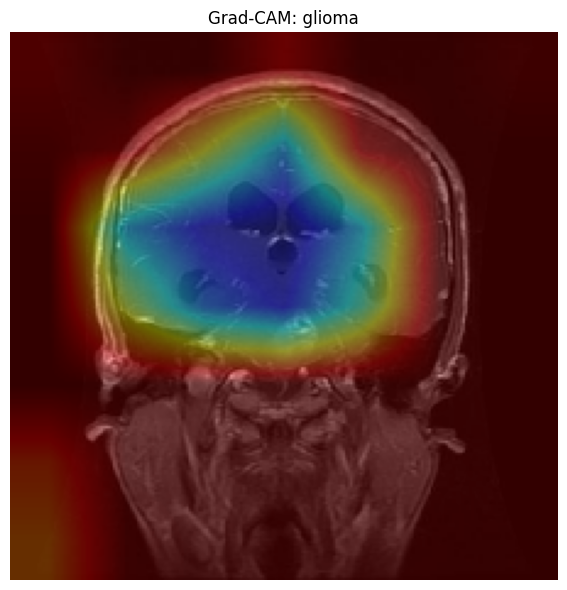

❌ glioma - Incorrect (Pred: meningioma)


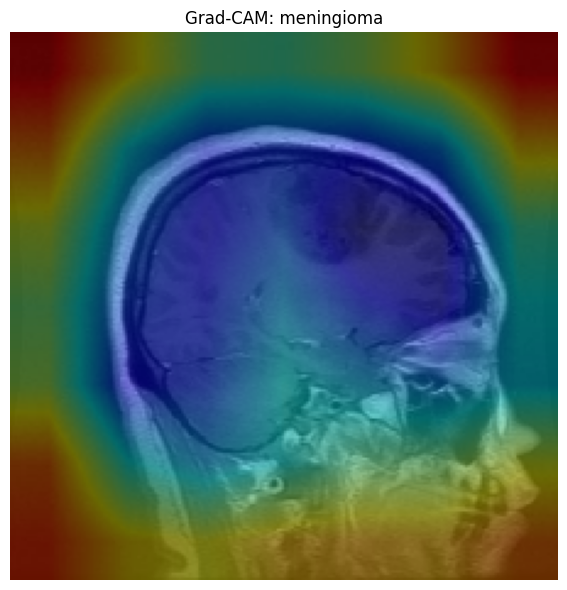

✅ meningioma - Correct


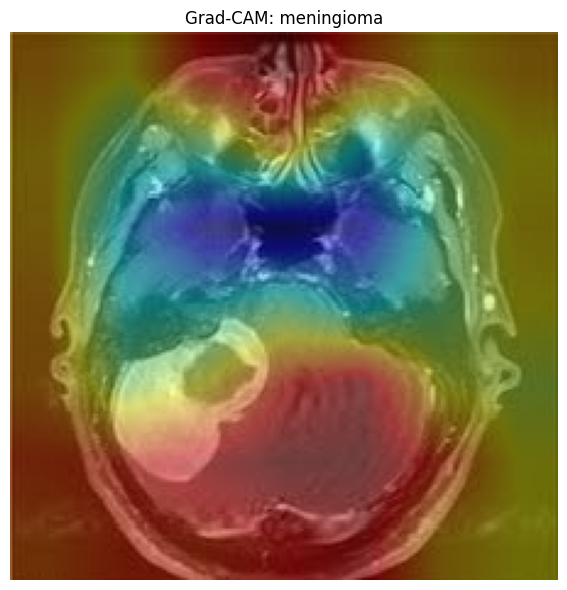

❌ meningioma - Incorrect (Pred: notumor)


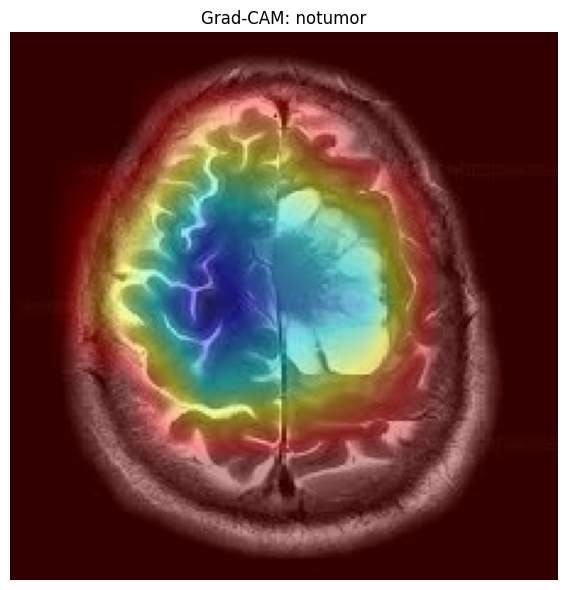

✅ notumor - Correct


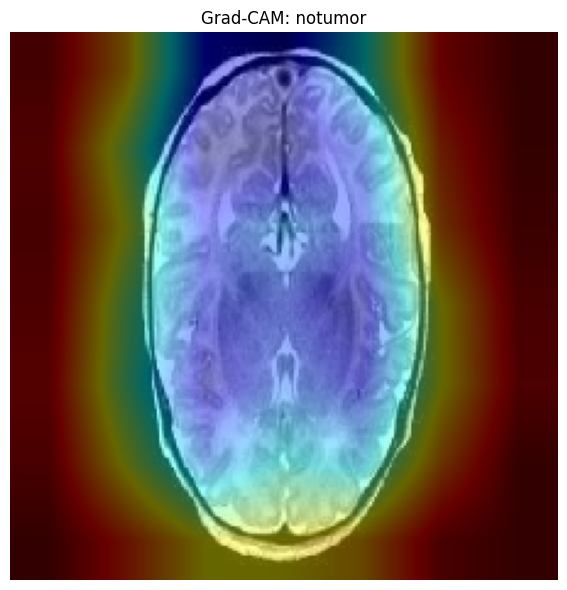

❌ notumor - Incorrect (Pred: meningioma)


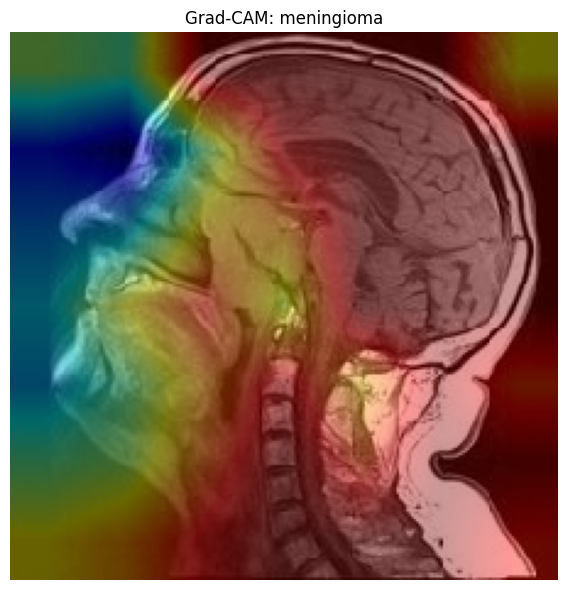

✅ pituitary - Correct


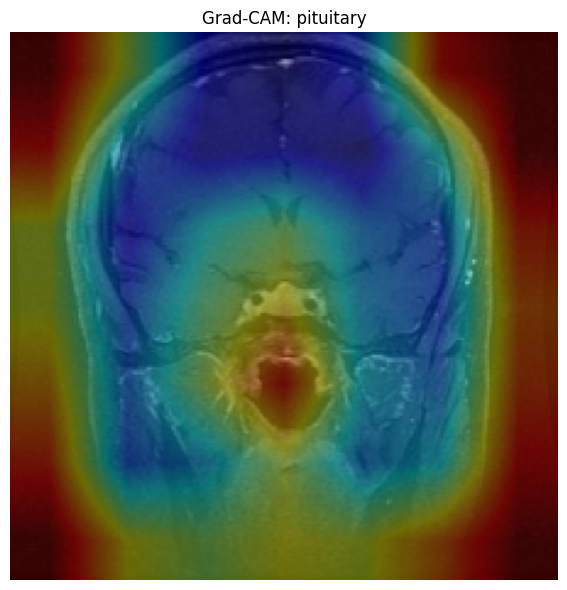

❌ pituitary - Incorrect (Pred: meningioma)


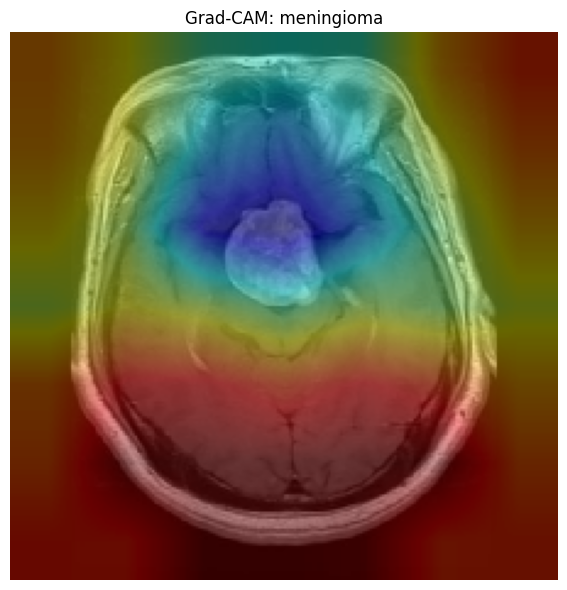

In [ ]:
gradcam_samples_by_class(evaluator_resnet)

## **ResNet Evaluation**

### Model Evaluator

In [64]:
from tensorflow.keras.applications.efficientnet import preprocess_input

evaluator_resnet = ModelEvaluator(
    model=resnet_model,
    history= history_resnet,
    test_gen=test_gen,
    class_names=list(test_gen_effnet.class_indices.keys()),
    input_size=(224, 224),
    preprocess_fn=preprocess_input,
    last_conv_layer='top_conv'  # For EfficientNetB0
)

evaluator.plot_training_curves()
evaluator.plot_confusion_matrix()
evaluator.show_classification_report()
evaluator.plot_per_class_accuracy()

AttributeError: 'NoneType' object has no attribute 'history'

### Grad-Cam Eval

🔍 Sampling Grad-CAMs: 1 correct + 1 incorrect per class

✅ glioma - Correct


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_723']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


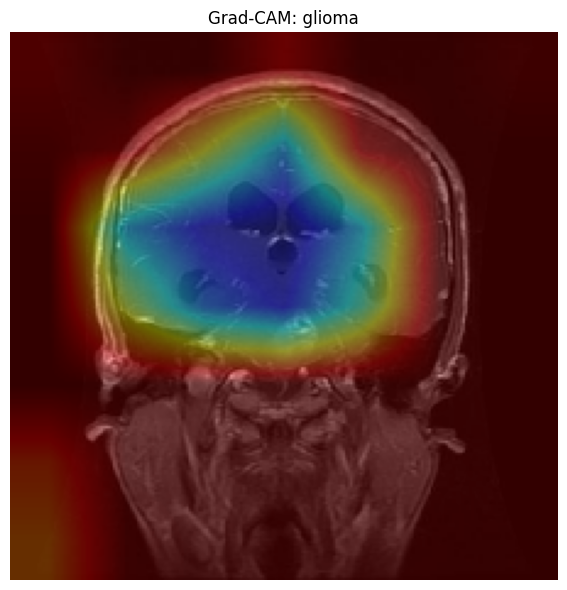

❌ glioma - Incorrect (Pred: meningioma)


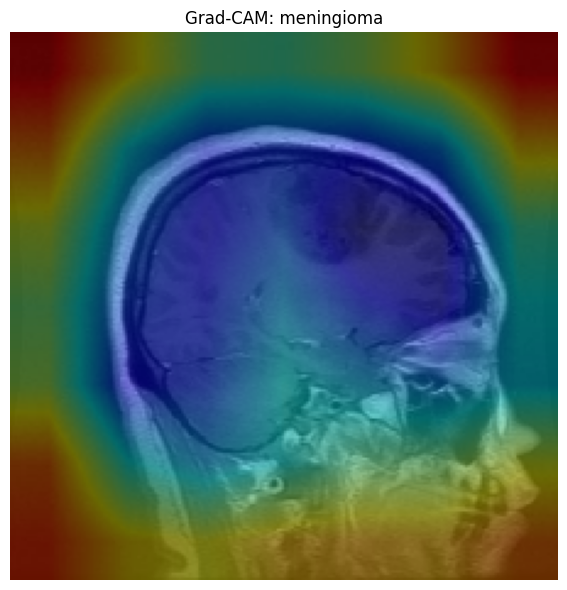

✅ meningioma - Correct


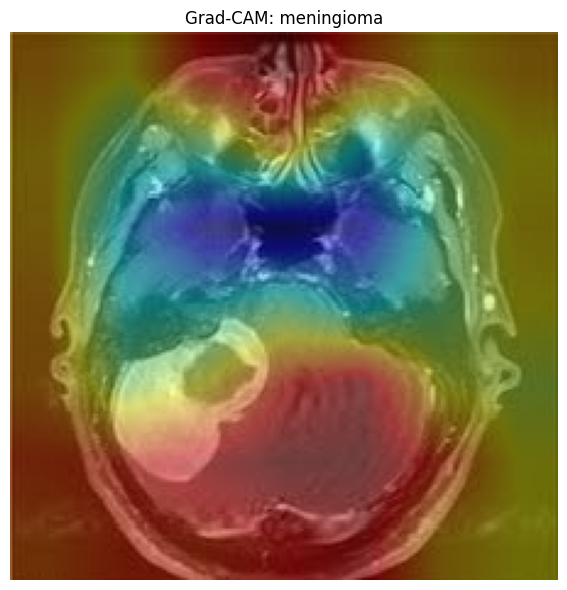

❌ meningioma - Incorrect (Pred: notumor)


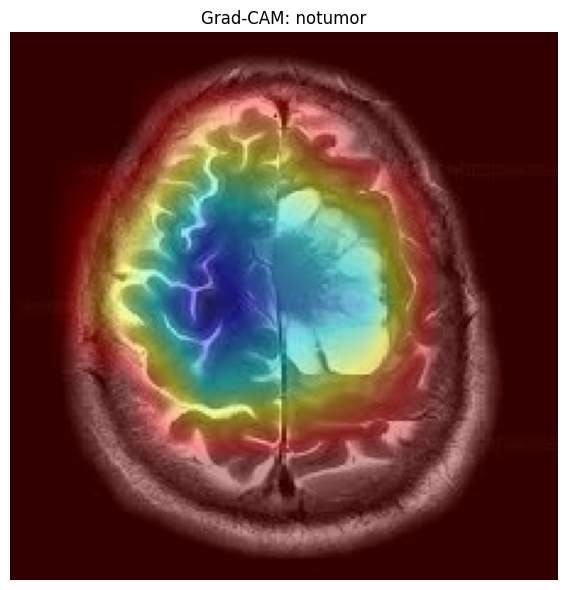

✅ notumor - Correct


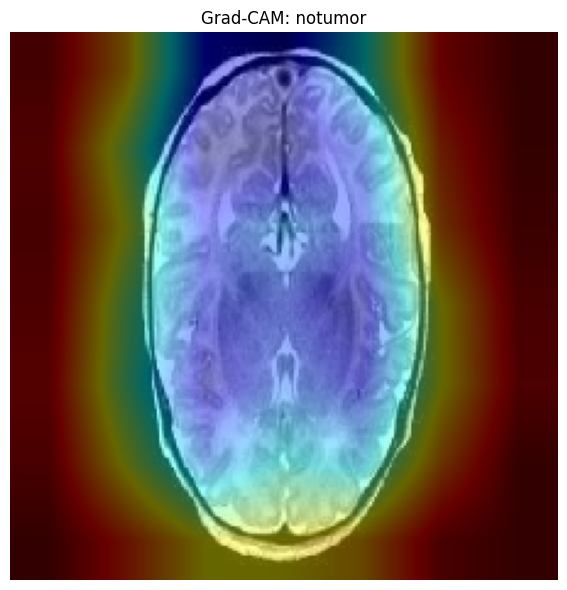

❌ notumor - Incorrect (Pred: meningioma)


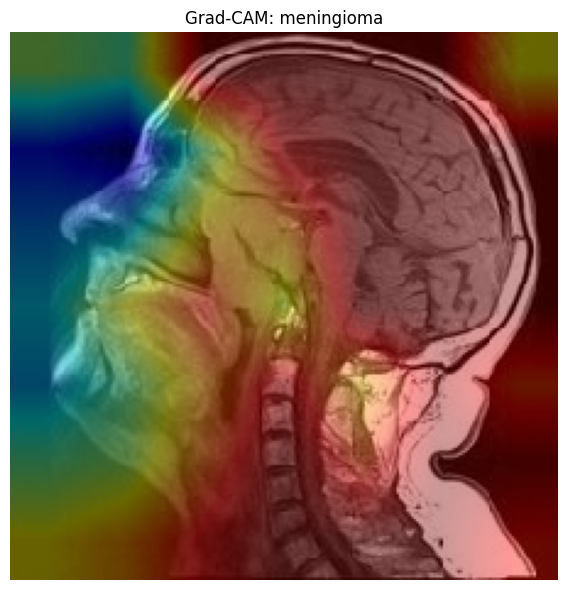

✅ pituitary - Correct


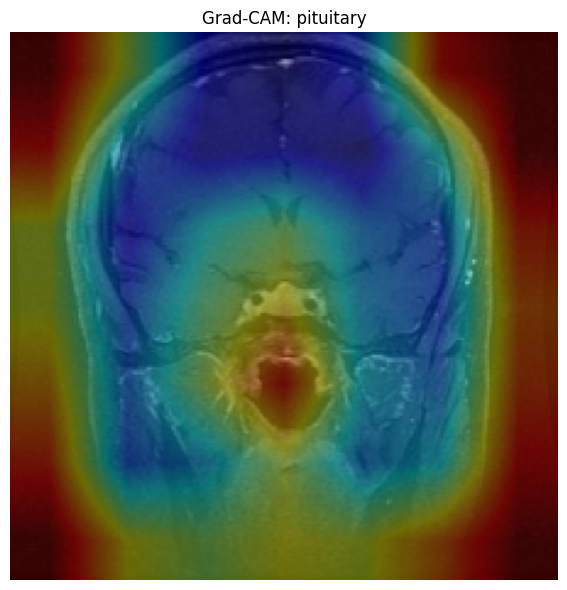

❌ pituitary - Incorrect (Pred: meningioma)


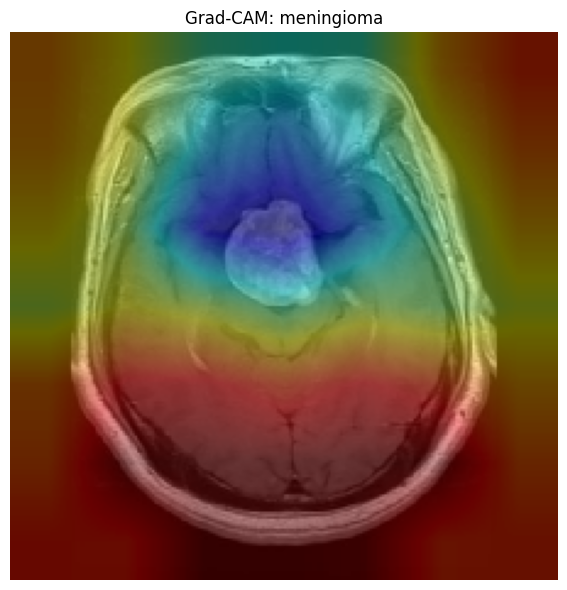

In [46]:
gradcam_samples_by_class(evaluator_resnet)

## **EfficientNetB0 Evaluation**

### Model Evaluator

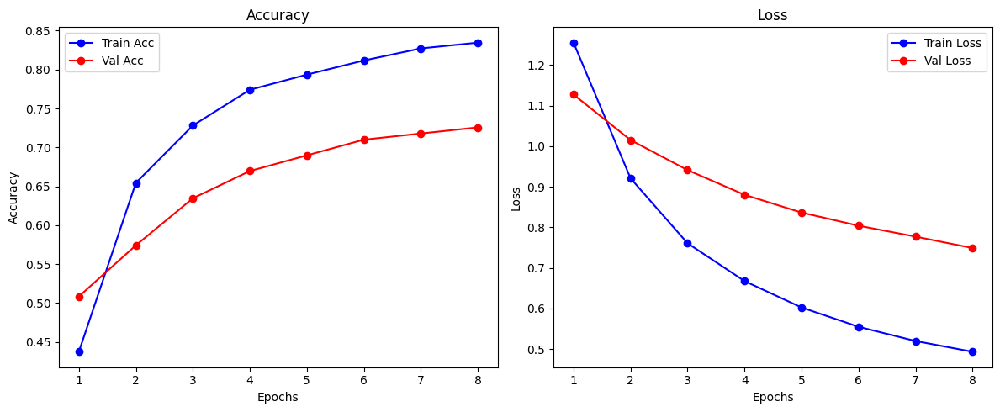

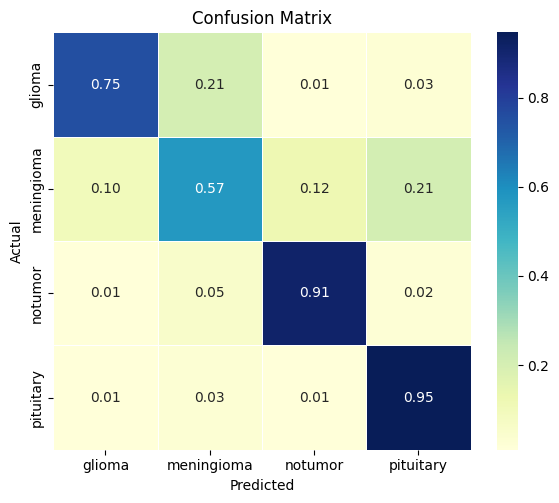

              precision    recall  f1-score   support

      glioma       0.85      0.75      0.80       300
  meningioma       0.65      0.57      0.61       306
     notumor       0.89      0.91      0.90       405
   pituitary       0.78      0.95      0.85       300

    accuracy                           0.80      1311
   macro avg       0.79      0.80      0.79      1311
weighted avg       0.80      0.80      0.80      1311



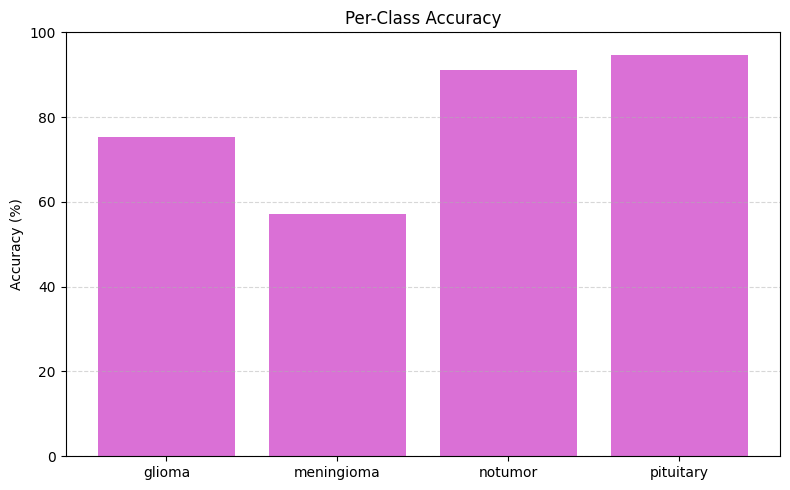

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_723']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


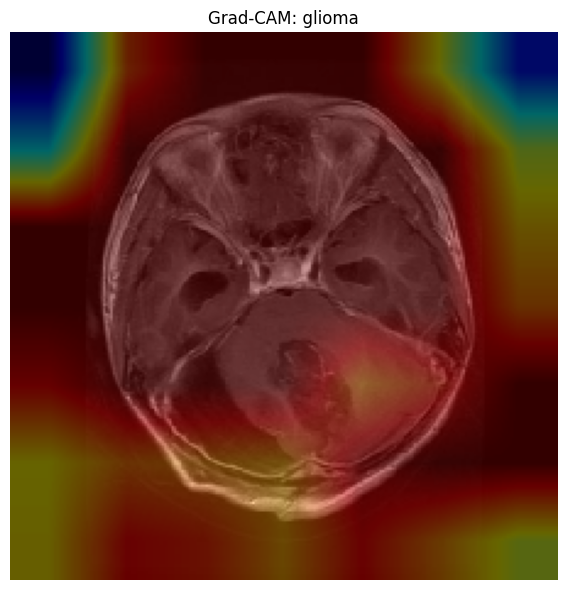

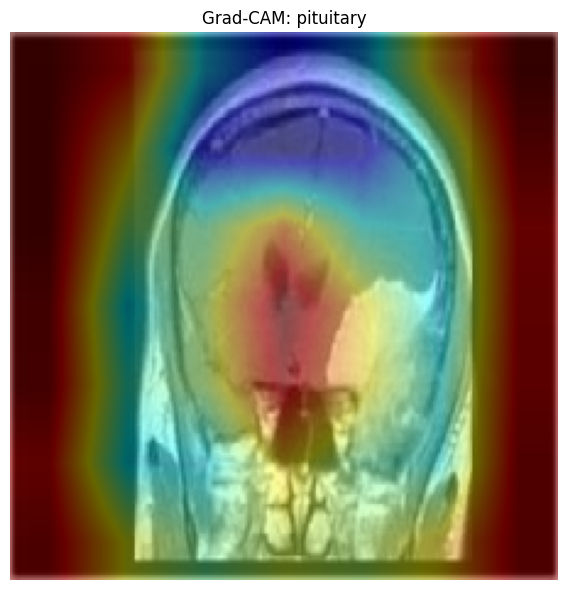

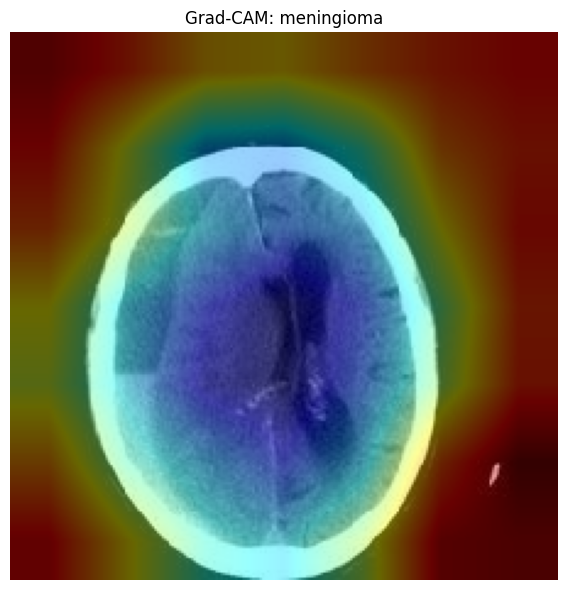

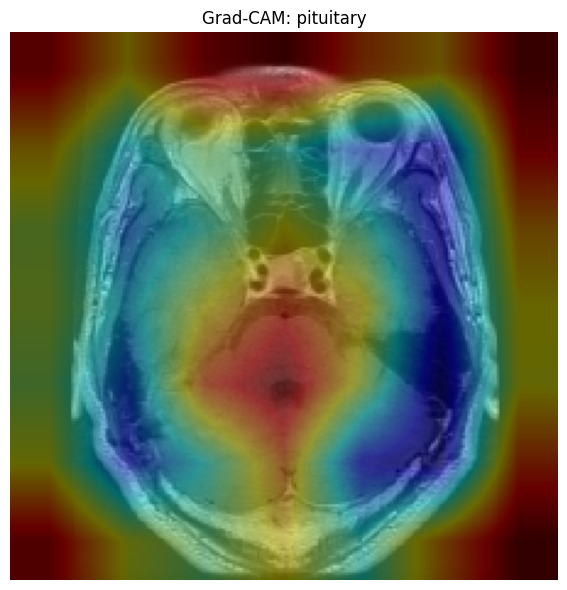

In [ ]:
from tensorflow.keras.applications.efficientnet import preprocess_input

evaluator_effnet = ModelEvaluator(
    model=effnet_model,
    history=history_resnet,
    test_gen=test_gen,
    class_names=list(test_gen_effnet.class_indices.keys()),
    input_size=(224, 224),
    preprocess_fn=preprocess_input,
    last_conv_layer='top_conv'  # For EfficientNetB0
)

evaluator.plot_training_curves()
evaluator.plot_confusion_matrix()
evaluator.show_classification_report()
evaluator.plot_per_class_accuracy()

### Grad-Cam Eval

🔍 Sampling Grad-CAMs: 1 correct + 1 incorrect per class

✅ glioma - Correct


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_723']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


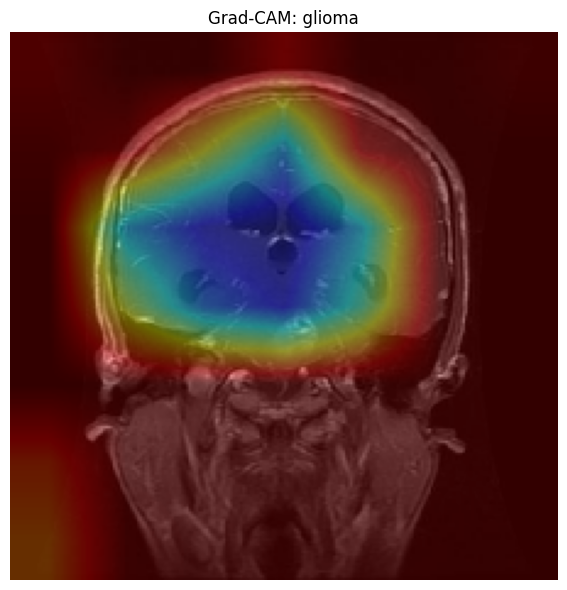

❌ glioma - Incorrect (Pred: meningioma)


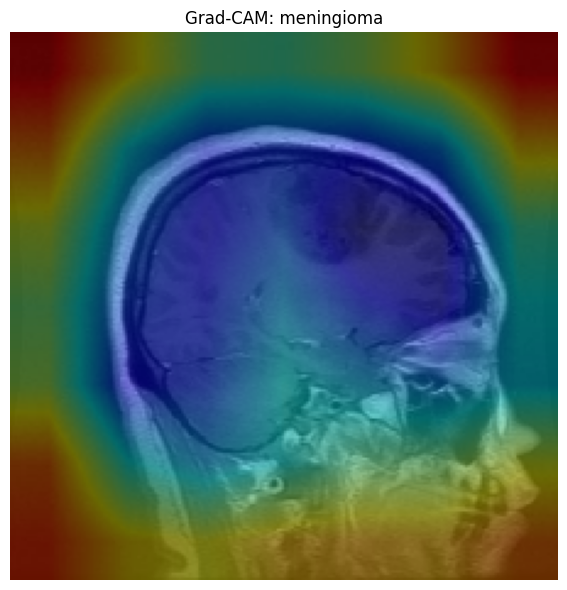

✅ meningioma - Correct


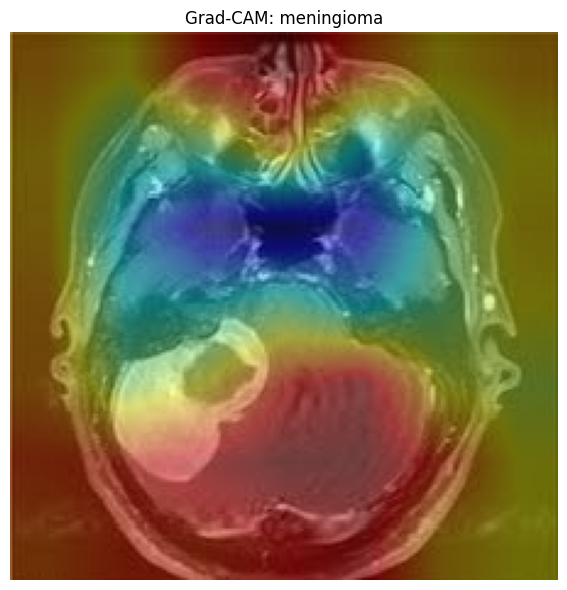

❌ meningioma - Incorrect (Pred: notumor)


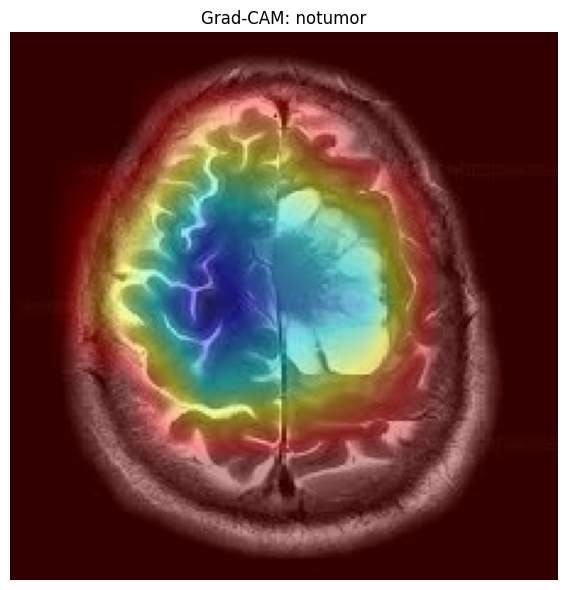

✅ notumor - Correct


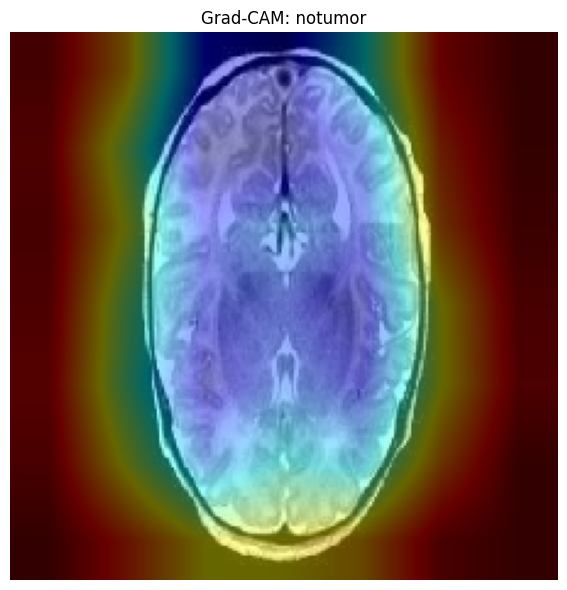

❌ notumor - Incorrect (Pred: meningioma)


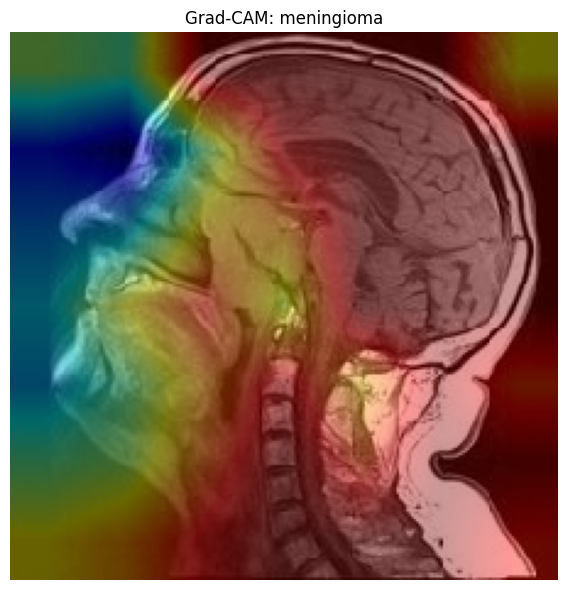

✅ pituitary - Correct


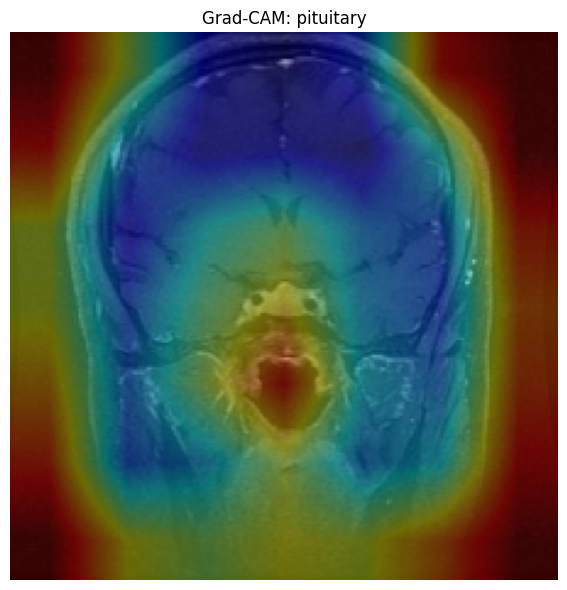

❌ pituitary - Incorrect (Pred: meningioma)


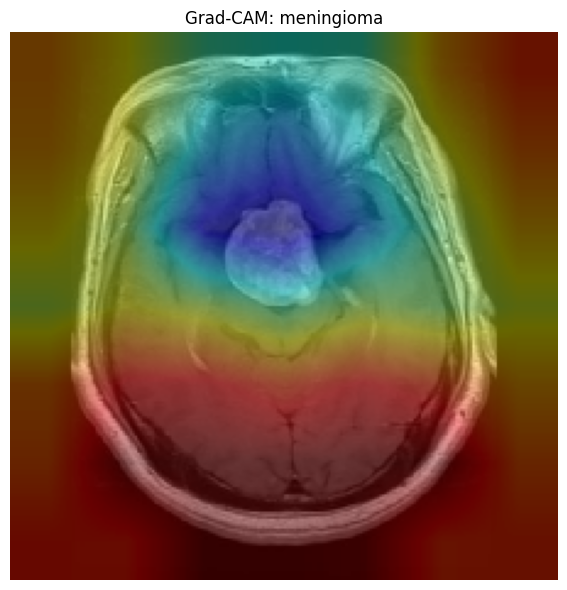

In [ ]:
gradcam_samples_by_class(evaluator_effnet)

# **To Do**

In [ ]:
# TODO: Train the model, plot loss/accuracy, evaluate on test set
# Include classification report and confusion matrix


In [ ]:
# TODO: Visualize model decisions using Grad-CAM
# Helpful for medical interpretability and transparency


In [ ]:
# Brief section on GDPR, anonymization, and use of open-access data


In [ ]:
# Reflect on performance, reproducibility, future improvements


# **Conclusion**